# Developing Brain Atlas through Deep Learning 

## A. Iqbal, R. Khan, T. Karayannis
# .
# .
# .

## Import libraries here
## Install missing libraries

In [1]:
import os
import sys
import random
import math
import re
import time
import numpy as np
import tensorflow as tf
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import matplotlib.gridspec as gridspec
from config import Config
from config import BrainConfig
import utils
import visualize
from visualize import display_images
from visualize import get_ax
import model as modellib
from model import log
import glob #for selecting png files in training images folder
from natsort import natsorted, ns #for sorting filenames in a directory
import skimage
from skimage import io
from skimage import transform

# Import testing dataset 
from brain_dataset import BrainDataset_Val

%matplotlib inline 

# Root directory of the project
ROOT_DIR = os.getcwd()

# Directory to save logs and trained model
MODEL_DIR = os.path.join(ROOT_DIR, "logs")

# Local path to trained weights file
BRAIN_MODEL_PATH = os.path.join(ROOT_DIR, "SeBRe_FINAL_WEIGHTS.h5")


Using TensorFlow backend.


## Configurations

In [2]:
config = BrainConfig()
class InferenceConfig(config.__class__):
    # Run detection on one image at a time
    GPU_COUNT = 1
    IMAGES_PER_GPU = 1

config = InferenceConfig()

## Notebook Preferences

In [3]:
# Device to load the neural network on.
DEVICE = "/cpu:0"  # /cpu:0 or /gpu:0

# Inspect the model in inference modes
TEST_MODE = "inference"

## Load Dataset

In [ ]:
# Build validation dataset
dataset_val = BrainDataset_Val()
dataset_val.load_brain()
dataset_val.prepare()
dataset = dataset_val

print("Images: {}\nClasses: {}".format(len(dataset.image_ids), dataset.class_names))

## Load Model

In [5]:
# Create model in inference mode
with tf.device(DEVICE):
    model = modellib.MaskRCNN(mode="inference", model_dir=MODEL_DIR,
                              config=config)

# Set weights file path
weights_path = BRAIN_MODEL_PATH

# Load weights
print("Loading weights ", weights_path)
model.load_weights(weights_path, by_name=True)

Loading weights  C:\Users\Asfandyar\Documents\Romesa\Scene_Parsing\Code\Mask_RCNN\NatMachIntell_Code_FINAL\SeBRe_FINAL_WEIGHTS.h5


## Figure 1: Block diagram and performance of SeBRe
# .
# .

### Figure1(a) : SeBRe block diagram

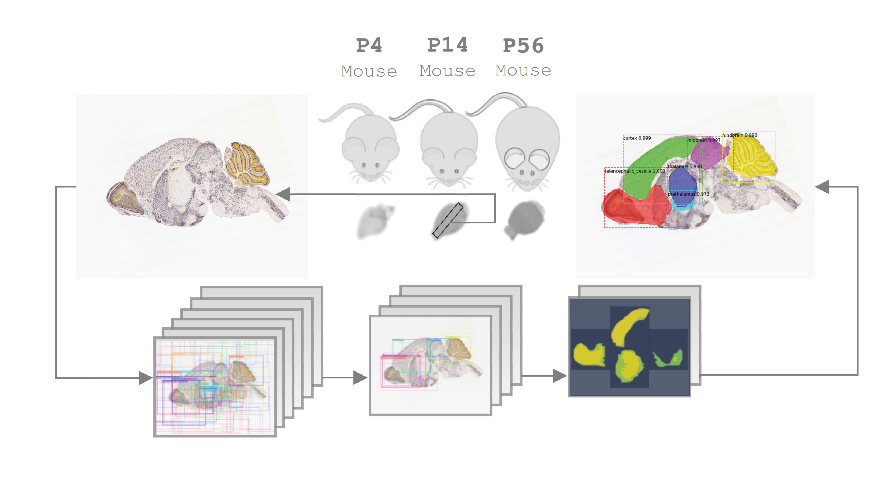

In [7]:
block_diag = os.path.join(ROOT_DIR,'DATASETsubmit')
os.chdir(block_diag)
diag = skimage.io.imread('figure_1_block_diag.png')
fig = plt.figure(figsize=(15,15))
plt.axis('off')
plt.imshow(diag)

### Figure 1(b)- column 2: Mask prediction by SeBRe on upright brain sections

In [8]:
mrcnn_val_data = os.path.join(ROOT_DIR, 'DATASETsubmit\\mrcnn_val_data')
os.chdir(mrcnn_val_data)
image_list = glob.glob('up*')
image_list = natsorted(image_list, key=lambda y: y.lower())

Processing 1 images
image                    shape: (1840, 2288, 3)       min:    0.00000  max:  255.00000
molded_images            shape: (1, 384, 384, 3)      min: -123.70000  max:  148.10000
image_metas              shape: (1, 17)               min:    0.00000  max: 2288.00000


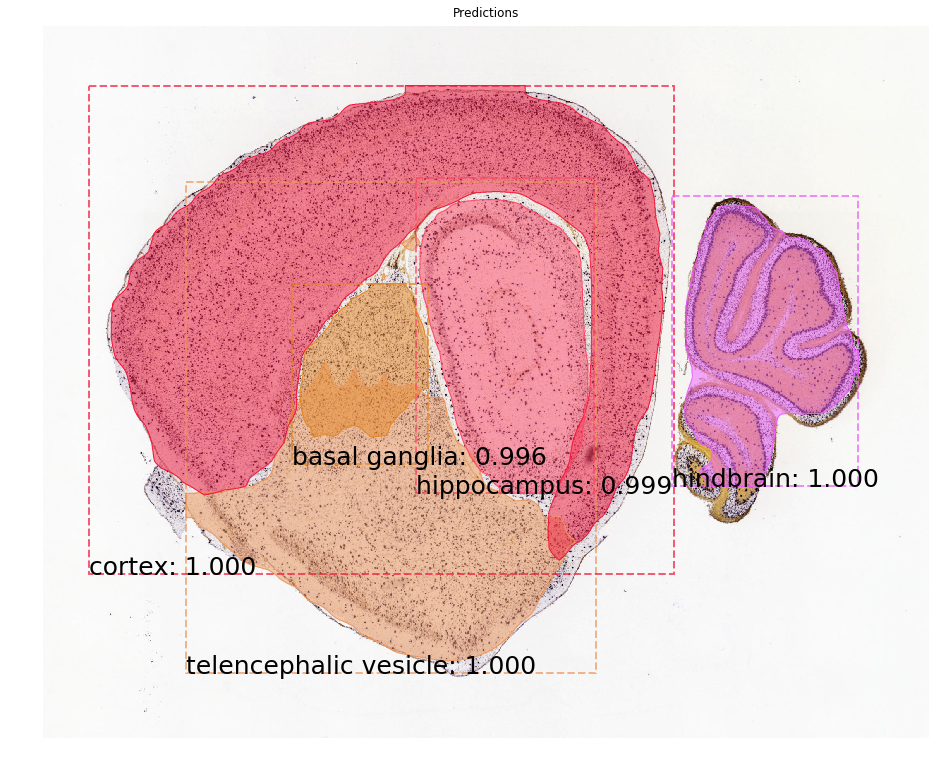

In [9]:
# Run object detection
image = skimage.io.imread(image_list[0])
results = model.detect([image], verbose=1)

# Display results
ax = get_ax(1)
r = results[0]
visualize.display_instances(image, r['rois'], r['masks'], r['class_ids'], 
                        dataset.class_names, r['scores'], ax=ax,
                        title="Predictions")


Processing 1 images
image                    shape: (1824, 2636, 3)       min:    0.00000  max:  255.00000
molded_images            shape: (1, 384, 384, 3)      min: -123.70000  max:  150.10000
image_metas              shape: (1, 17)               min:    0.00000  max: 2636.00000


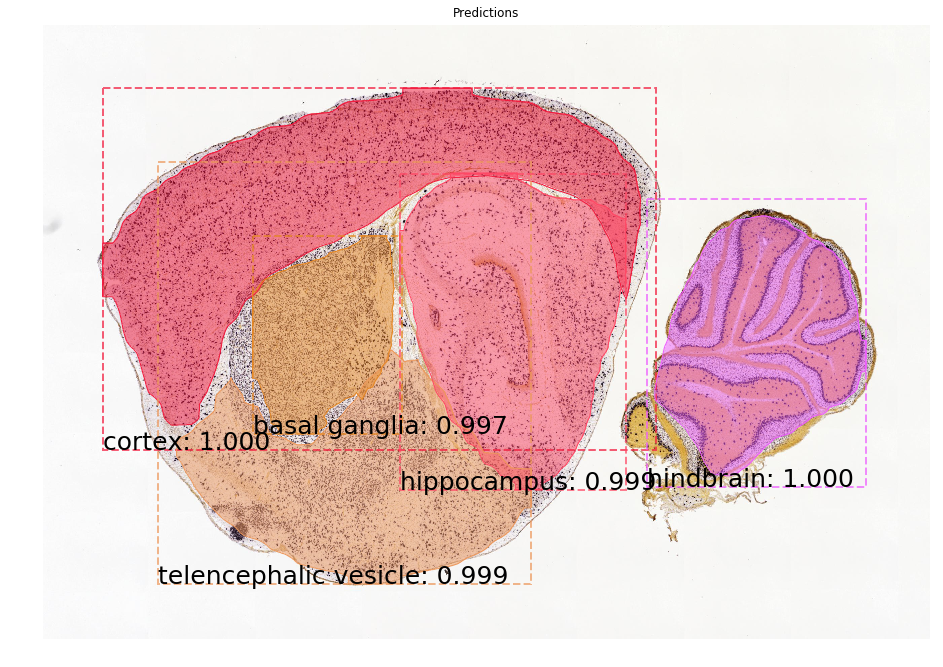

In [26]:
# Run object detection
image = skimage.io.imread(image_list[1])
results = model.detect([image], verbose=1)

# Display results
ax = get_ax(1)
r = results[0]
visualize.display_instances(image, r['rois'], r['masks'], r['class_ids'], 
                        dataset.class_names, r['scores'], ax=ax,
                        title="Predictions")


Processing 1 images
image                    shape: (2192, 3616, 3)       min:    0.00000  max:  255.00000
molded_images            shape: (1, 384, 384, 3)      min: -123.70000  max:  150.10000
image_metas              shape: (1, 17)               min:    0.00000  max: 3616.00000


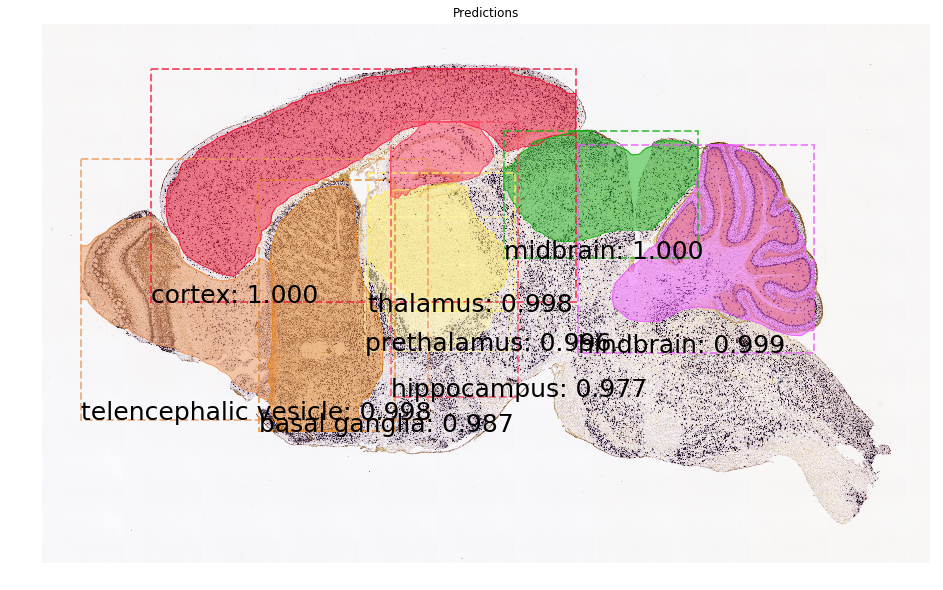

In [27]:
# Run object detection
image = skimage.io.imread(image_list[2])
results = model.detect([image], verbose=1)

# Display results
ax = get_ax(1)
r = results[0]
visualize.display_instances(image, r['rois'], r['masks'], r['class_ids'], 
                        dataset.class_names, r['scores'], ax=ax,
                        title="Predictions")


Processing 1 images
image                    shape: (2128, 3248, 3)       min:    0.00000  max:  255.00000
molded_images            shape: (1, 384, 384, 3)      min: -123.70000  max:  148.10000
image_metas              shape: (1, 17)               min:    0.00000  max: 3248.00000


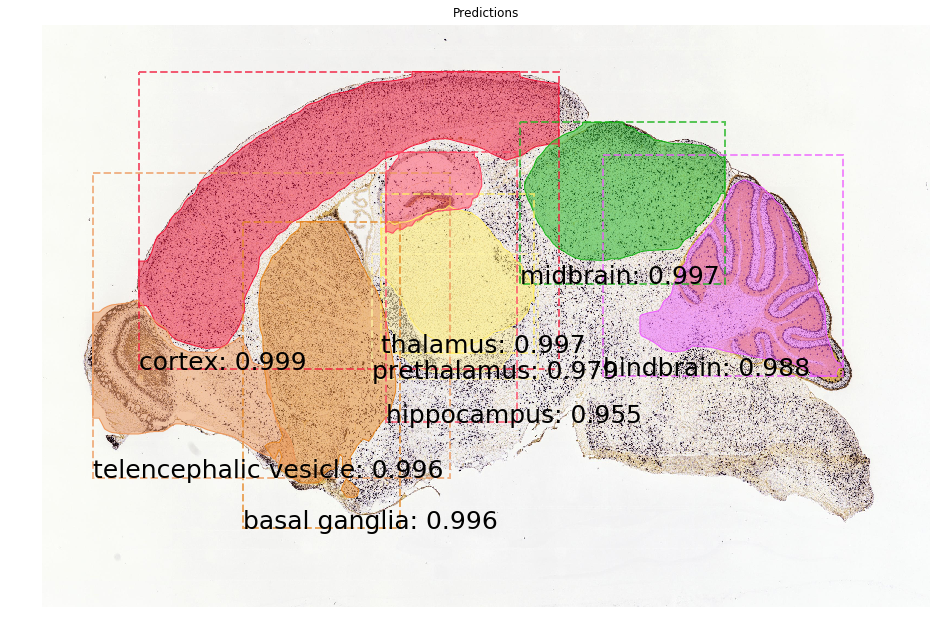

In [28]:
# Run object detection
image = skimage.io.imread(image_list[3])
results = model.detect([image], verbose=1)

# Display results
ax = get_ax(1)
r = results[0]
visualize.display_instances(image, r['rois'], r['masks'], r['class_ids'], 
                        dataset.class_names, r['scores'], ax=ax,
                        title="Predictions")


### Figure 1(b)- column 3 & Figure 2(a)- column 1: Mask prediction by SeBRe on rotated brain sections

In [10]:
mrcnn_val_data = os.path.join(ROOT_DIR, 'DATASETsubmit\\mrcnn_val_data')
os.chdir(mrcnn_val_data)
image_list = glob.glob('rot*')
image_list = natsorted(image_list, key=lambda y: y.lower())

Processing 1 images
image                    shape: (2457, 2745, 3)       min:    0.00000  max:  255.00000
molded_images            shape: (1, 384, 384, 3)      min: -123.70000  max:  149.10000
image_metas              shape: (1, 17)               min:    0.00000  max: 2745.00000


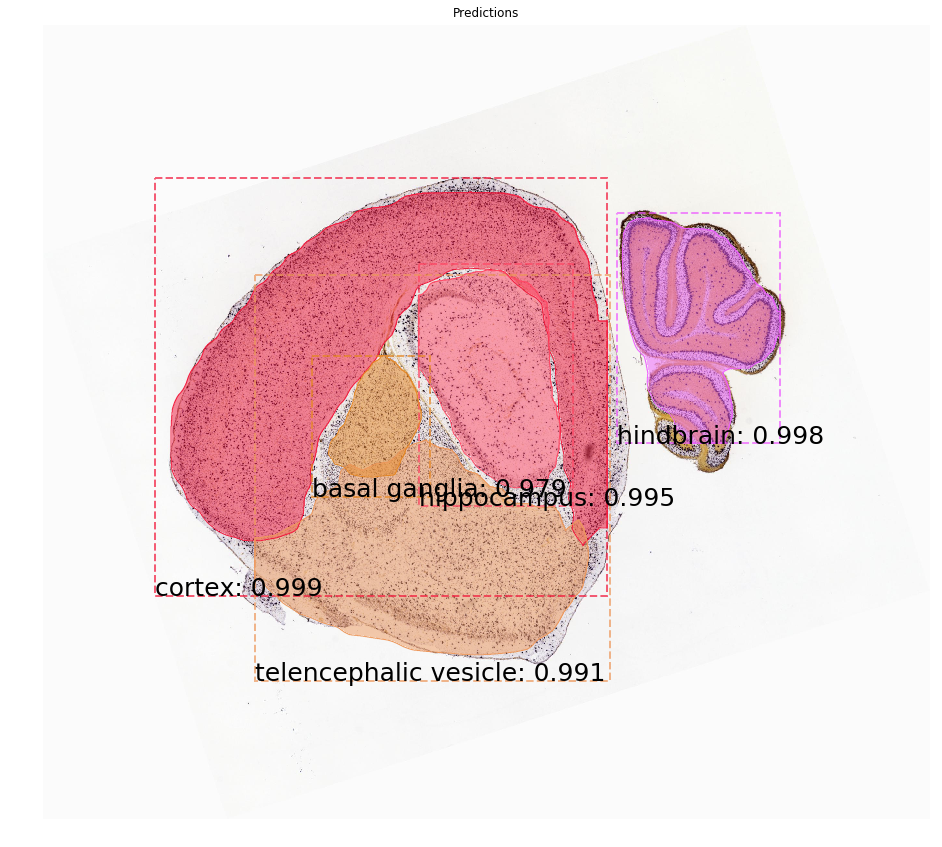

In [11]:
# Run object detection
image = skimage.io.imread(image_list[0])
results = model.detect([image], verbose=1)

# Display results
ax = get_ax(1)
r = results[0]
visualize.display_instances(image, r['rois'], r['masks'], r['class_ids'], 
                        dataset.class_names, r['scores'], ax=ax,
                        title="Predictions")


Processing 1 images
image                    shape: (3111, 3780, 3)       min:    0.00000  max:  255.00000
molded_images            shape: (1, 384, 384, 3)      min: -123.70000  max:  149.10000
image_metas              shape: (1, 17)               min:    0.00000  max: 3780.00000


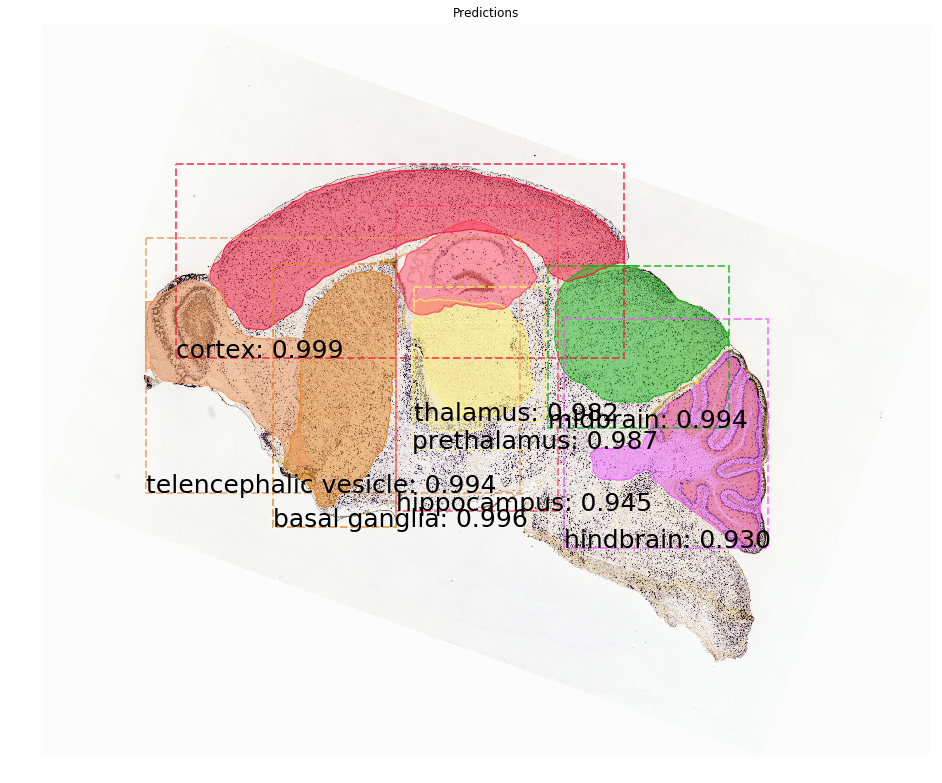

In [33]:
# Run object detection
image = skimage.io.imread(image_list[1])
results = model.detect([image], verbose=1)

# Display results
ax = get_ax(1)
r = results[0]
visualize.display_instances(image, r['rois'], r['masks'], r['class_ids'], 
                        dataset.class_names, r['scores'], ax=ax,
                        title="Predictions")


Processing 1 images
image                    shape: (2550, 3071, 3)       min:    0.00000  max:  255.00000
molded_images            shape: (1, 384, 384, 3)      min: -123.70000  max:  149.10000
image_metas              shape: (1, 17)               min:    0.00000  max: 3071.00000


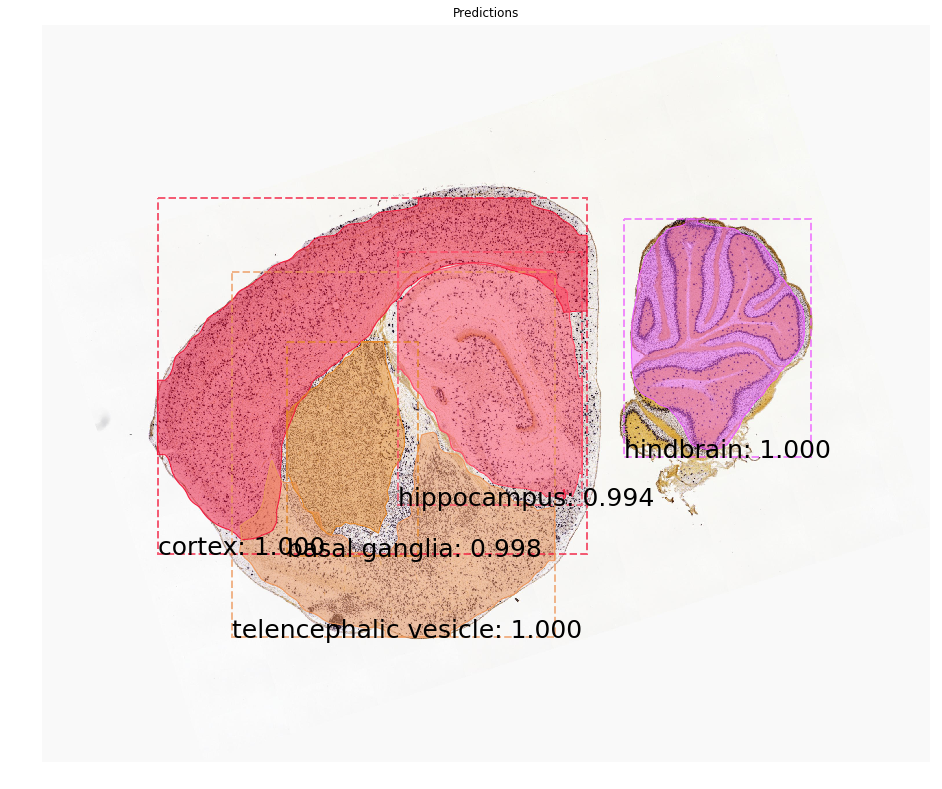

In [34]:
# Run object detection
image = skimage.io.imread(image_list[2])
results = model.detect([image], verbose=1)

# Display results
ax = get_ax(1)
r = results[0]
visualize.display_instances(image, r['rois'], r['masks'], r['class_ids'], 
                        dataset.class_names, r['scores'], ax=ax,
                        title="Predictions")


Processing 1 images
image                    shape: (2787, 3942, 3)       min:    0.00000  max:  255.00000
molded_images            shape: (1, 384, 384, 3)      min: -123.70000  max:  150.10000
image_metas              shape: (1, 17)               min:    0.00000  max: 3942.00000


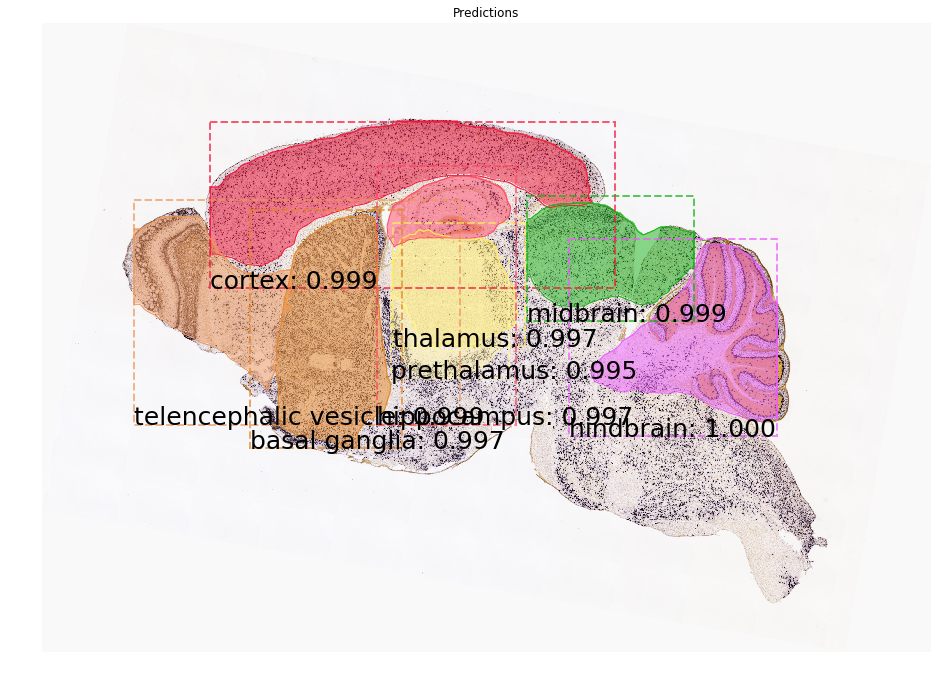

In [35]:
# Run object detection
image = skimage.io.imread(image_list[3])
results = model.detect([image], verbose=1)

# Display results
ax = get_ax(1)
r = results[0]
visualize.display_instances(image, r['rois'], r['masks'], r['class_ids'], 
                        dataset.class_names, r['scores'], ax=ax,
                        title="Predictions")


## Figure 2: Performance comparison of SeBRe with commonly used brain registration methods
# .
# .

### Figure 2(a)- column 3: ndreg registration on rotated brain sections

In [12]:
ndreg_results = os.path.join(ROOT_DIR,'DATASETsubmit\\ndreg_results')
os.chdir(ndreg_results)
image_list = glob.glob('*')
image_list = natsorted(image_list, key=lambda y: y.lower())

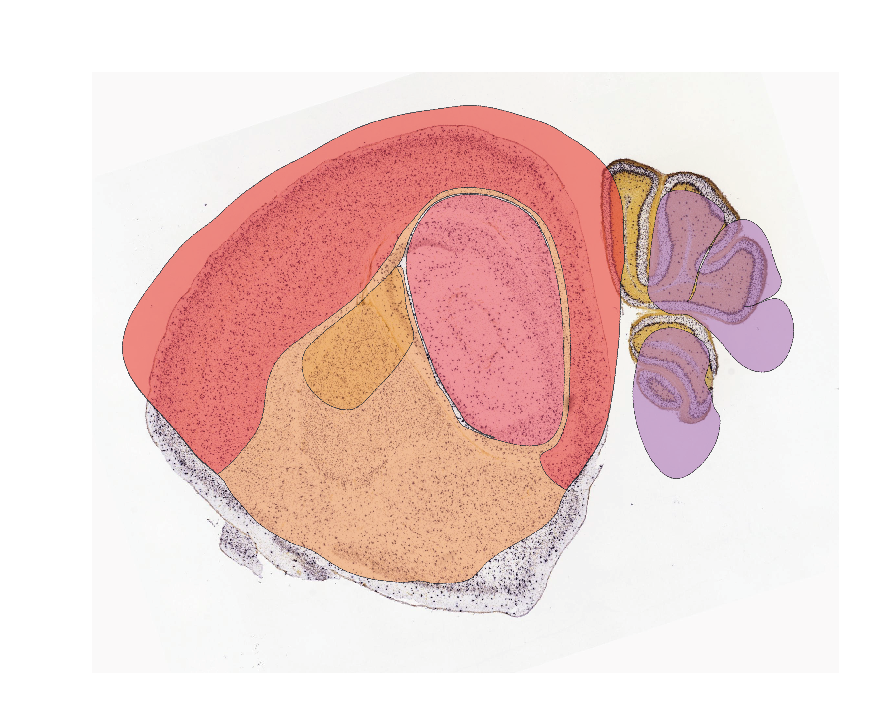

In [13]:
image = skimage.io.imread(image_list[0])
fig = plt.figure(figsize=(15,15))
plt.axis('off')
plt.imshow(image)

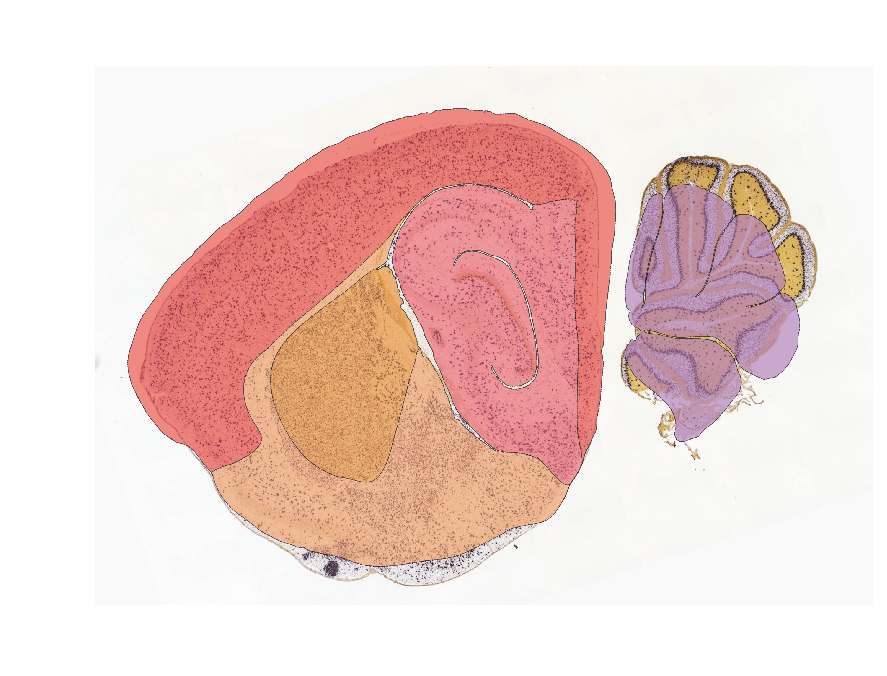

In [43]:
image = skimage.io.imread(image_list[1])
fig = plt.figure(figsize=(15,15))
plt.axis('off')
plt.imshow(image)

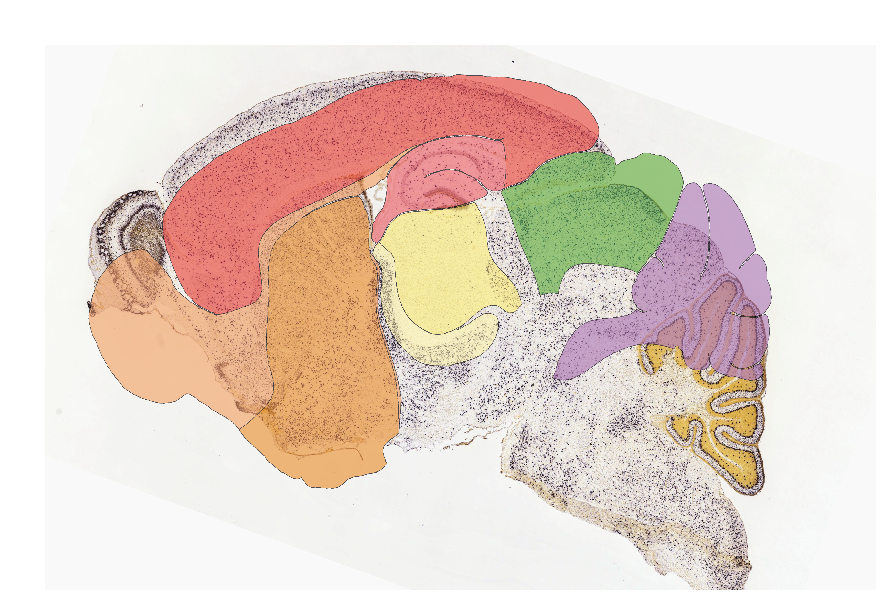

In [44]:
image = skimage.io.imread(image_list[2])
fig = plt.figure(figsize=(15,15))
plt.axis('off')
plt.imshow(image)

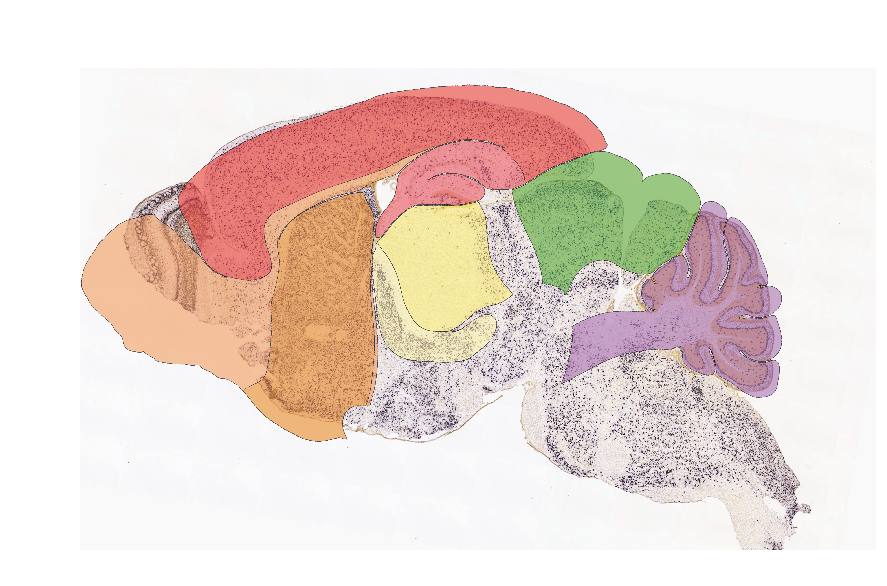

In [45]:
image = skimage.io.imread(image_list[3])
fig = plt.figure(figsize=(15,15))
plt.axis('off')
plt.imshow(image)

### Figure 2(a)- column 2: elastix registration on rotated brain sections

In [14]:
elastix_results = os.path.join(ROOT_DIR,'DATASETsubmit\\elastix_results')
os.chdir(elastix_results)
image_list = glob.glob('*')
image_list = natsorted(image_list, key=lambda y: y.lower())

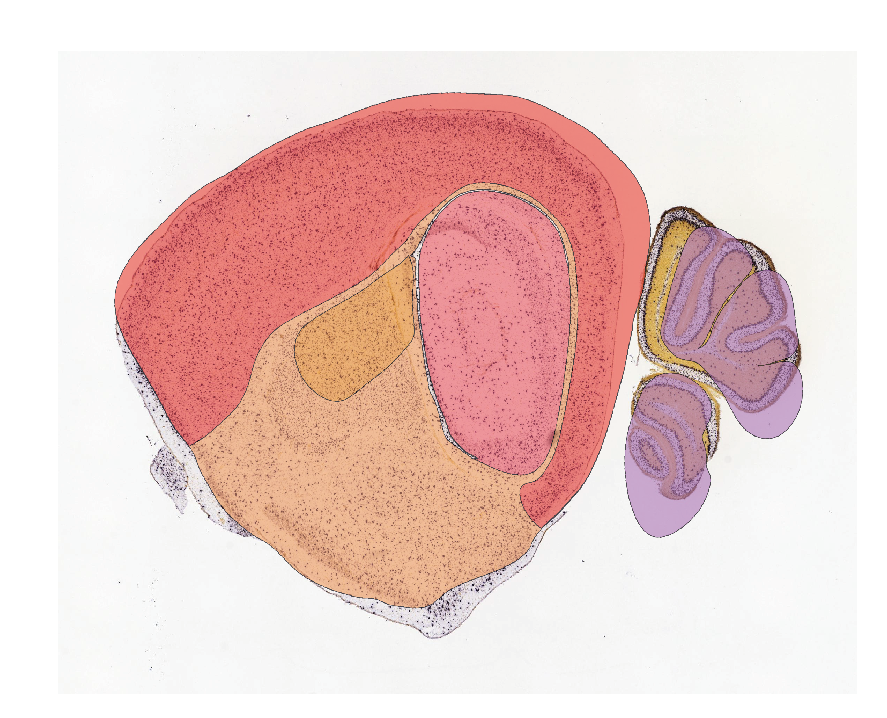

In [15]:
image = skimage.io.imread(image_list[0])
fig = plt.figure(figsize=(15,15))
plt.axis('off')
plt.imshow(image)

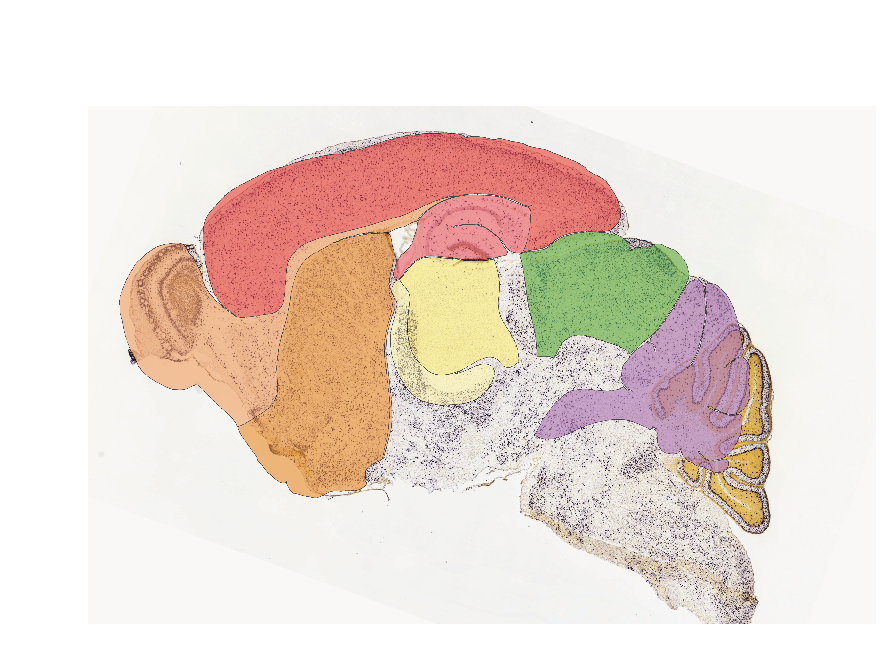

In [51]:
image = skimage.io.imread(image_list[1])
fig = plt.figure(figsize=(15,15))
plt.axis('off')
plt.imshow(image)

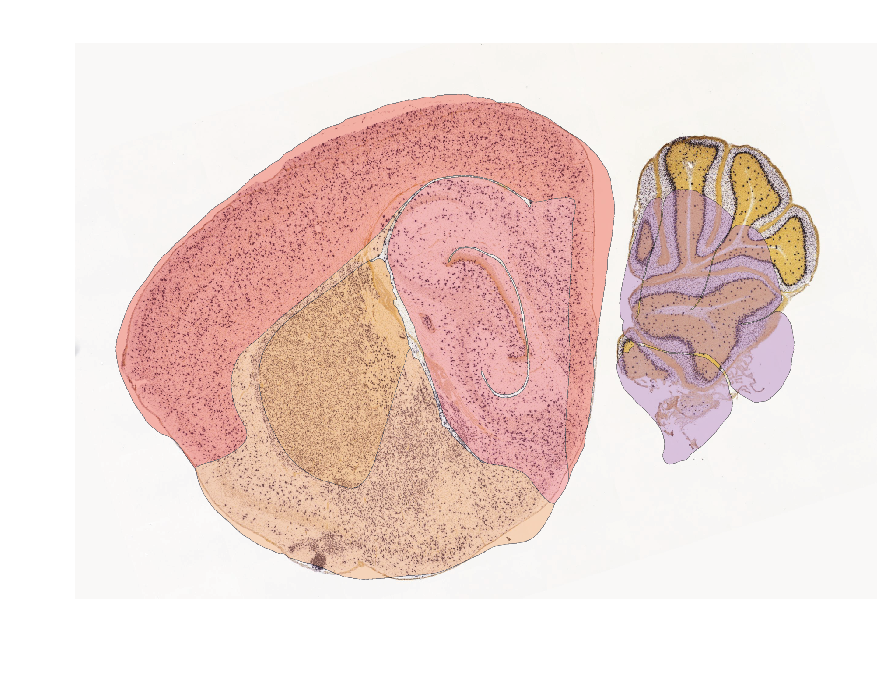

In [52]:
image = skimage.io.imread(image_list[2])
fig = plt.figure(figsize=(15,15))
plt.axis('off')
plt.imshow(image)

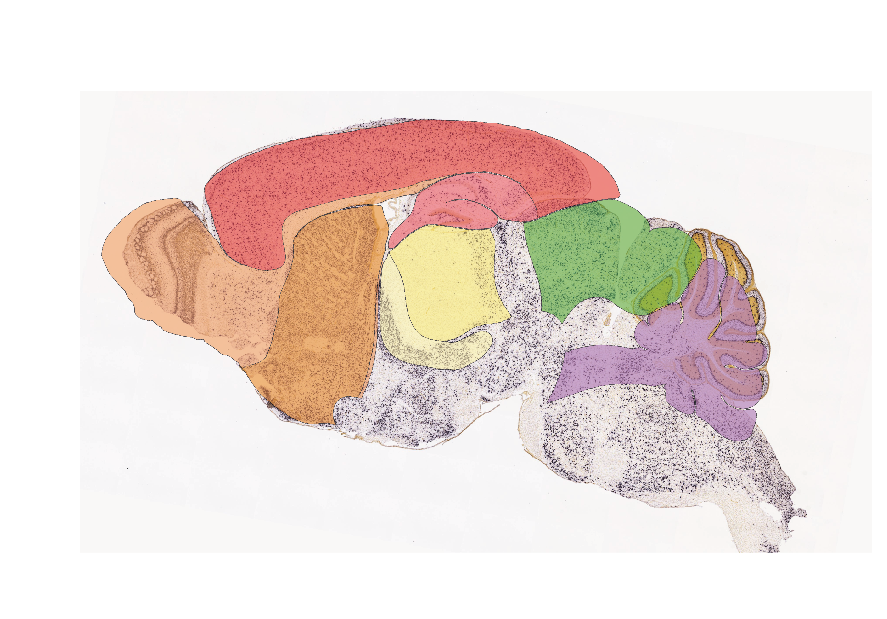

In [54]:
image = skimage.io.imread(image_list[3])
fig = plt.figure(figsize=(15,15))
plt.axis('off')
plt.imshow(image)

## Supplemenatry Figure 2: Region-specific masks for lateral and medial sagittal P14 GAD1 and VGAT groundtruth brain sections
# .
# .

In [8]:
image_id_list = [130,110,90,170]#np.random.choice(dataset.image_ids, 1)[0]

original image shape:  (1872, 2864, 3)
image                    shape: (384, 384, 3)         min:    0.00000  max:  252.00000
image_meta               shape: (17,)                 min:    0.00000  max: 2864.00000
class_ids                shape: (6,)                  min:    1.00000  max:    8.00000
bbox                     shape: (6, 4)                min:   20.00000  max:  347.00000
mask                     shape: (384, 384, 6)         min:    0.00000  max:  255.00000


C:\Users\Asfandyar\AppData\Roaming\Python\Python35\site-packages\scipy\ndimage\interpolation.py:616: UserWarning: From scipy 0.13.0, the output shape of zoom() is calculated with round() instead of int() - for these inputs the size of the returned array has changed.
  "the returned array has changed.", UserWarning)


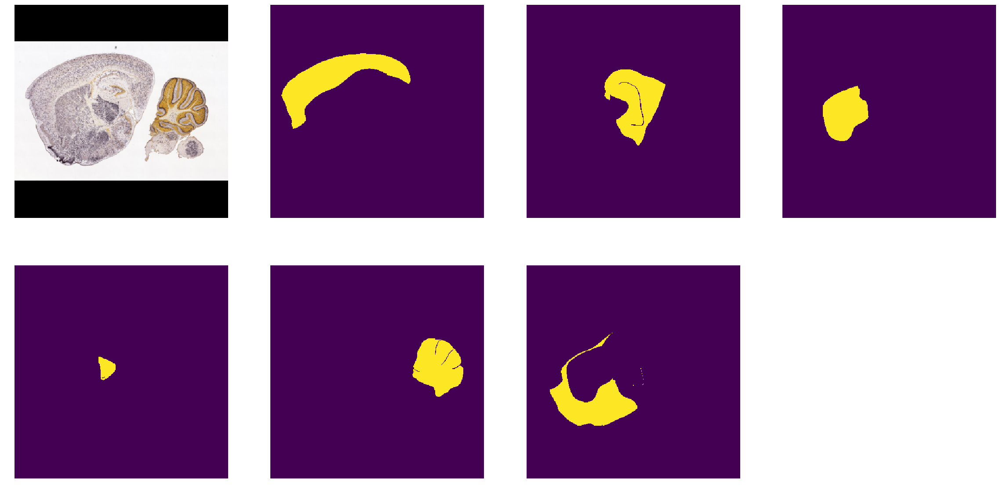

In [9]:
image, image_meta, class_ids, bbox, mask = modellib.load_image_gt(
    dataset, config, image_id_list[0], use_mini_mask=False)

log("image", image)
log("image_meta", image_meta)
log("class_ids", class_ids)
log("bbox", bbox)
log("mask", mask)

display_images([image]+[mask[:,:,i] for i in range(min(mask.shape[-1], 7))])

original image shape:  (1824, 2636, 3)
image                    shape: (384, 384, 3)         min:    0.00000  max:  254.00000
image_meta               shape: (17,)                 min:    0.00000  max: 2636.00000
class_ids                shape: (5,)                  min:    1.00000  max:    8.00000
bbox                     shape: (5, 4)                min:   27.00000  max:  360.00000
mask                     shape: (384, 384, 5)         min:    0.00000  max:  255.00000


C:\Users\Asfandyar\AppData\Roaming\Python\Python35\site-packages\scipy\ndimage\interpolation.py:616: UserWarning: From scipy 0.13.0, the output shape of zoom() is calculated with round() instead of int() - for these inputs the size of the returned array has changed.
  "the returned array has changed.", UserWarning)


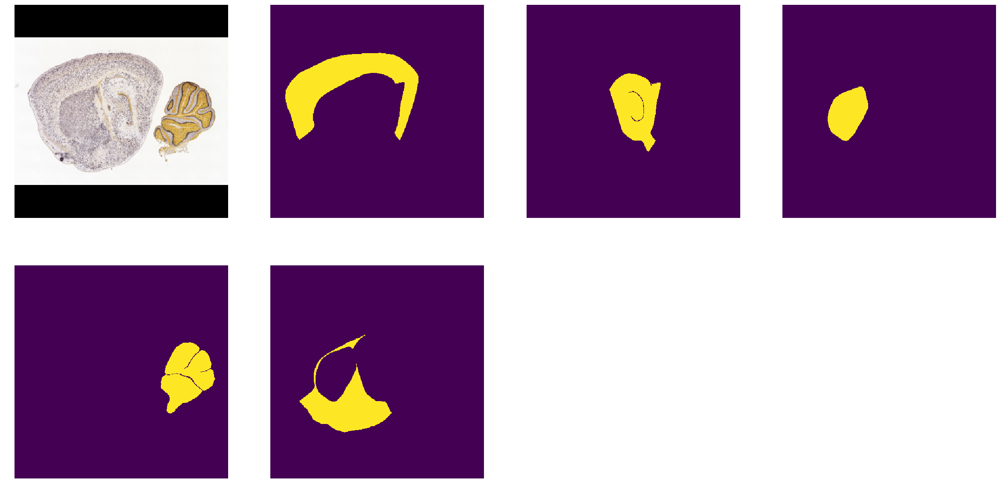

In [10]:
image, image_meta, class_ids, bbox, mask = modellib.load_image_gt(
    dataset, config, image_id_list[1], use_mini_mask=False)

log("image", image)
log("image_meta", image_meta)
log("class_ids", class_ids)
log("bbox", bbox)
log("mask", mask)

display_images([image]+[mask[:,:,i] for i in range(min(mask.shape[-1], 7))])

original image shape:  (2160, 3400, 3)
image                    shape: (384, 384, 3)         min:    0.00000  max:  253.00000
image_meta               shape: (17,)                 min:    0.00000  max: 3400.00000
class_ids                shape: (7,)                  min:    1.00000  max:    8.00000
bbox                     shape: (7, 4)                min:   19.00000  max:  356.00000
mask                     shape: (384, 384, 7)         min:    0.00000  max:  255.00000


C:\Users\Asfandyar\AppData\Roaming\Python\Python35\site-packages\scipy\ndimage\interpolation.py:616: UserWarning: From scipy 0.13.0, the output shape of zoom() is calculated with round() instead of int() - for these inputs the size of the returned array has changed.
  "the returned array has changed.", UserWarning)


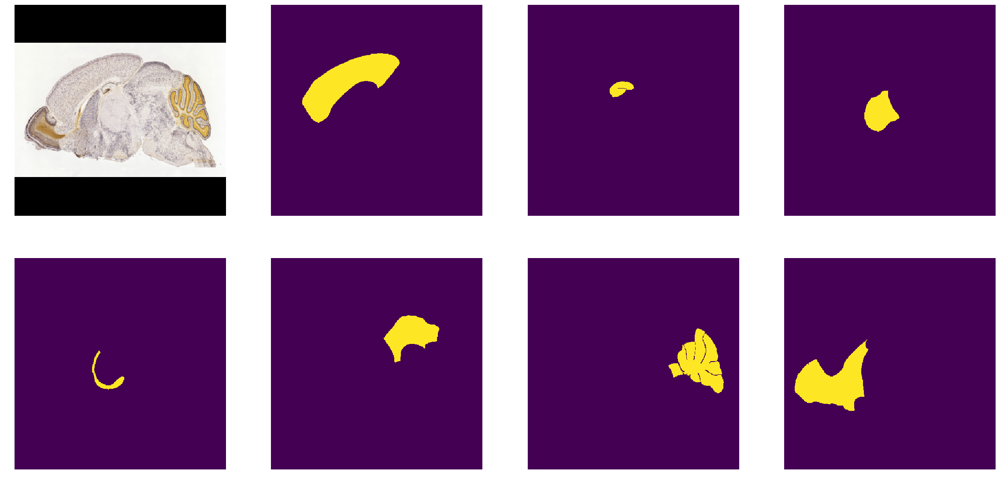

In [11]:
image, image_meta, class_ids, bbox, mask = modellib.load_image_gt(
    dataset, config, image_id_list[2], use_mini_mask=False)

log("image", image)
log("image_meta", image_meta)
log("class_ids", class_ids)
log("bbox", bbox)
log("mask", mask)

display_images([image]+[mask[:,:,i] for i in range(min(mask.shape[-1], 7))])

original image shape:  (2232, 3764, 3)
image                    shape: (384, 384, 3)         min:    0.00000  max:  254.00000
image_meta               shape: (17,)                 min:    0.00000  max: 3764.00000
class_ids                shape: (7,)                  min:    1.00000  max:    8.00000
bbox                     shape: (7, 4)                min:   17.00000  max:  341.00000
mask                     shape: (384, 384, 7)         min:    0.00000  max:  255.00000


C:\Users\Asfandyar\AppData\Roaming\Python\Python35\site-packages\scipy\ndimage\interpolation.py:616: UserWarning: From scipy 0.13.0, the output shape of zoom() is calculated with round() instead of int() - for these inputs the size of the returned array has changed.
  "the returned array has changed.", UserWarning)


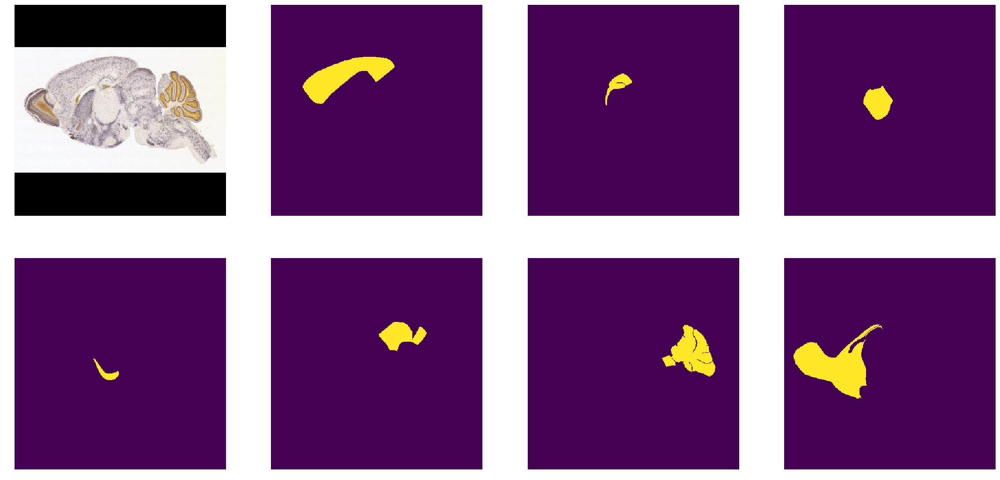

In [12]:
image, image_meta, class_ids, bbox, mask = modellib.load_image_gt(
    dataset, config, image_id_list[3], use_mini_mask=False)

log("image", image)
log("image_meta", image_meta)
log("class_ids", class_ids)
log("bbox", bbox)
log("mask", mask)

display_images([image]+[mask[:,:,i] for i in range(min(mask.shape[-1], 7))])

## Supplementary Figure 5: Output feature maps at different stages of SeBRe image processing pipeline
# .
# .

### Supplementary Figure 5(a): Activations of feature maps output by ResNet101-FPN backbone

In [23]:
# Get activations of a few sample layers
activations = model.run_graph([image], [
    ("input_image",        model.keras_model.get_layer("input_image").output),
    ("res4w_out",          model.keras_model.get_layer("res4w_out").output),  # for resnet100
    ("rpn_bbox",           model.keras_model.get_layer("rpn_bbox").output),
    ("roi",                model.keras_model.get_layer("ROI").output),
])

input_image              shape: (1, 384, 384, 3)      min: -123.70000  max:  150.10001
res4w_out                shape: (1, 24, 24, 1024)     min:    0.00000  max:   58.81488
rpn_bbox                 shape: (1, 36828, 4)         min:   -5.98674  max:   88.82722
roi                      shape: (1, 1000, 4)          min:    0.00000  max:    1.00000


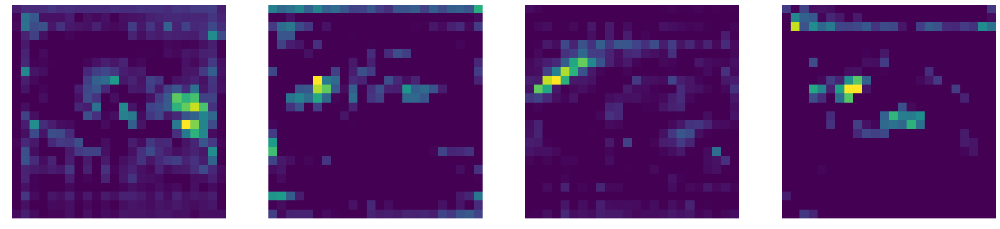

In [24]:
# Backbone feature map
display_images(np.transpose(activations["res4w_out"][0,:,:,:4], [2, 0, 1]))

### Supplementary Figure 5(b): Output feature maps of FPN head, predicting masks for input brain section

In [25]:
# Get predictions of mask head
mrcnn = model.run_graph([image], [
    ("detections", model.keras_model.get_layer("mrcnn_detection").output),
    ("masks", model.keras_model.get_layer("mrcnn_mask").output),
])

# Get detection class IDs. Trim zero padding.
det_class_ids = mrcnn['detections'][0, :, 4].astype(np.int32)
det_count = np.where(det_class_ids == 0)[0][0]
det_class_ids = det_class_ids[:det_count]

print("{} detections: {}".format(
    det_count, np.array(dataset.class_names)[det_class_ids]))

detections               shape: (1, 8, 6)             min:    0.00000  max:  336.00000
masks                    shape: (1, 8, 28, 28, 9)     min:    0.00000  max:    1.00000
7 detections: ['cortex:' 'midbrain:' 'hindbrain:' 'thalamus:' 'prethalamus:'
 'telencephalic vesicle:' 'basal ganglia:']


In [26]:
# Masks
det_boxes = mrcnn["detections"][0, :, :4].astype(np.int32)
det_mask_specific = np.array([mrcnn["masks"][0, i, :, :, c] 
                              for i, c in enumerate(det_class_ids)])
det_masks = np.array([utils.unmold_mask(m, det_boxes[i], image.shape)
                      for i, m in enumerate(det_mask_specific)])
log("det_mask_specific", det_mask_specific)
log("det_masks", det_masks)

det_mask_specific        shape: (7, 28, 28)           min:    0.00000  max:    1.00000
det_masks                shape: (7, 384, 384)         min:    0.00000  max:    1.00000


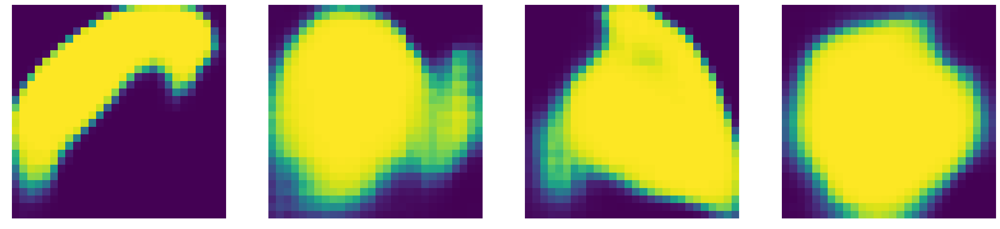

In [27]:
display_images(det_mask_specific[:4] * 255, cmap="viridis", interpolation="none")